In [ ]:
import numpy as np
import math
from matplotlib import pyplot as plt
from matplotlib import colors
from IPython import display
import random

# Inputs.
grid_size = 5
path = "/content/drive/MyDrive/Nicolas - Personal/2024/Johns Hopkins/Project"
original_track = np.genfromtxt(path + '/track.csv', delimiter=',')
directions = np.genfromtxt(path + '/directions.csv', delimiter=',')

# Track rows and columns
track_rows = len(original_track)
track_cols = int(original_track.size/len(original_track))

# Build input and output training data.
training_input = []
training_output = []
for r in range(0, track_rows - grid_size + 1):
  for c in range(0, track_cols - grid_size + 1):
    track_pov = original_track[r: r+grid_size, c: c+grid_size]
    direct_pov = directions[r: r+grid_size, c: c+grid_size]
    center = direct_pov[int((grid_size-1)/2), int((grid_size-1)/2)]
    if center != 0 and center !=3:
      training_input.append(track_pov)
      if center == 1:
        training_output.append(0)
      elif center == 2:
        training_output.append(0.5)
      elif center == 4:
        training_output.append(1)

# Training data size
print("Input length: ", len(training_input))
print("Output length: ", len(training_output))

Input length:  162
Output length:  162


In [ ]:
# Shuffle lists
combined = list(zip(training_input, training_output))
random.shuffle(combined)
training_input, training_output = zip(*combined)

# Reshape data.
xs = []
ys = []
for x, z in zip(training_input, training_output):
  ct = 0
  top = sum(x[0]) + x[1][0] + x[1][4] + (x[1][1] + x[1][2] + x[1][3])*3
  left = (x[1][1] + x[2][1])*3 + x[0][0] + x[1][0] + x[2][0] + x[0][1]
  right = (x[1][3] + x[2][3])*3 + x[0][4] + x[1][4] + x[2][4] + x[0][3]
  xs.append(left - right)
  ys.append(-top)
max_x, max_y, min_x, min_y = max(xs), max(ys), min(xs), min(ys)

# X and Y are inputs, Z is the output.
X = [((x-min_x)/(max_x-min_x))*2 -1 for x in xs]
Y = [((y-min_y)/(max_y-min_y))*2 -1 for y in ys]
Z = training_output

In [ ]:
# Define the membership functions.
# Triangle membership function for the car's horizontal movement.
def horizontal(x, type):
    if type == "l":
        return -0.5*x + 0.5
    elif type == "r":
        return 0.5*x + 0.5
# Exponential membership function for the car's vertical movement.
def vertical(x, type):
    return math.exp(-0.1*(x+1))

# Define functions to get basis functions (phi)
def get_phi(X, Y):
    phi = np.zeros((len(X), 2))
    for i in range(len(X)):
        x, y = X[i], Y[i]
        h_k1 = horizontal(x, "l")*vertical(y, "u")
        h_k2 = horizontal(x, "r")*vertical(y, "u")
        phi[i, 0] = h_k1 / (h_k1 + h_k2)
        phi[i, 1] = h_k2 / (h_k1 + h_k2)
    return phi

# Define function to get derivatives
def get_derivatives(x, y, theta):
    h_k1 = horizontal(x, "l") * vertical(y, "u")
    h_k2 = horizontal(x, "r")

    # Calculate weights
    weights = np.array([h_k1, h_k2])

    # Calculate derivatives
    der = [0, 0]
    der[0] = (h_k1 * theta[0]) / np.sum(weights)
    der[1] = (h_k2 * theta[1]) / np.sum(weights)
    return der

# Define function to get error
def get_error(x, y, z, theta):
    # Get basis functions
    h_k1 = horizontal(x, "l")*vertical(y, "u")
    h_k2 = horizontal(x, "r")

    # Multiply by the center (yb_k, also thetha_k).
    top_1 = h_k1*theta[0];
    top_2 = h_k2*theta[1];

    # Add all numerators and divide by the sum of all weights.
    z_ca = sum([top_1, top_2])/sum([h_k1, h_k2]);

    # Calculate error
    error = z_ca - z
    return error

In [ ]:
# Initialize parameters
theta = np.array([0, 1, 10])
initial_previous_error = 1e10
error = 0
step_size = 1e-3
delta = 1e-5
iterations = 0
max_iterations = 2000

# Modes:
# 0: Serial steepest descent
# 1: Parallel steepest descent
mode = 1

if mode == 0:
  m = 0
  # Loop through data points for serial steepest descent
  for x, y, z in zip(X, Y, Z):
      previous_error = initial_previous_error
      while ((abs(error - previous_error) >= delta) and (iterations < max_iterations)):
          previous_error = error
          error = int(get_error(x, y, z, theta))
          derivatives = get_derivatives(x, y, theta)
          gradient = [error * d for d in derivatives]
          theta = [t - step_size*g for t,g in zip(theta, gradient)]
      iterations += 1
      m += 1

elif mode == 1:
  # Obtain the optimal centers using parallel steepest descent.
  done_k = 0
  previous_loop_error = 1e5
  loop_error = 0
  while ((abs(previous_loop_error - loop_error) > delta) and (iterations < max_iterations)):
      previous_loop_error = loop_error
      loop_error = 0
      for m in range(len(X)):

          # Extract training pair.
          x, y, z = X[m], Y[m], Z[m]

          # Obtain the derivative with respect to each center (yb_k).
          derivatives = get_derivatives(x, y, theta)

          # Get error (see functions at the bottom of the file).
          error = get_error(x, y, z, theta)
          loop_error = loop_error + error

          # Compute gradient.
          gradient = [error * d for d in derivatives]

          # Update the theta vector.
          theta = [t - step_size*g for t,g in zip(theta, gradient)]

      # Add 1 to iteration.
      iterations += 1
      if (iterations % 50 == 0):
        print("\nIteration: ", iterations)
        print("Error difference: ", previous_loop_error - loop_error)

  # Print final iteration.
  print("\nTotal number of iterations: ", iterations)
  print("Error difference: ", previous_loop_error - loop_error)



Iteration:  50
Error difference:  0.23659394148375767

Iteration:  100
Error difference:  0.0562881676650111

Iteration:  150
Error difference:  0.017072353226296855

Iteration:  200
Error difference:  0.005556772127661702

Iteration:  250
Error difference:  0.0018501641732413532

Iteration:  300
Error difference:  0.000620680286719022

Iteration:  350
Error difference:  0.00020874748944876842

Iteration:  400
Error difference:  7.026562214207388e-05

Iteration:  450
Error difference:  2.3658570185602912e-05

Total number of iterations:  490
Error difference:  9.904139318450689e-06


In [ ]:
# Predict.
def predict_direction(input, theta, min_x, max_x, min_y, max_y):
  x = input
  top = sum(x[0]) + x[1][0] + x[1][4] + (x[1][1] + x[1][2] + x[1][3])*3
  left = (x[1][1] + x[2][1])*3 + x[0][0] + x[1][0] + x[2][0] + x[0][1]
  right = (x[1][3] + x[2][3])*3 + x[0][4] + x[1][4] + x[2][4] + x[0][3]
  phi = get_phi([(((left - right) - min_x)/(max_x - min_x))*2 -1], [(((-top) - min_y)/(max_y - min_y))*2 -1])
  return round(np.dot(phi, theta)[0]*2)

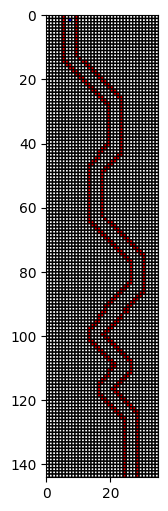

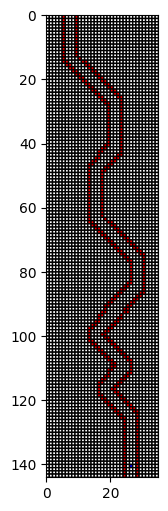

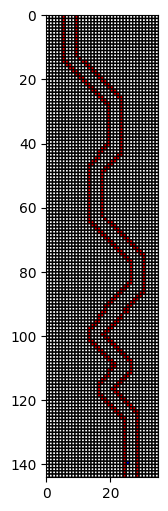

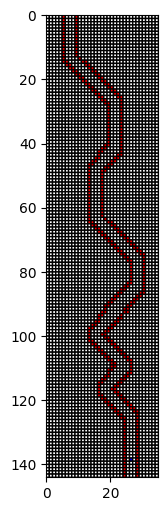

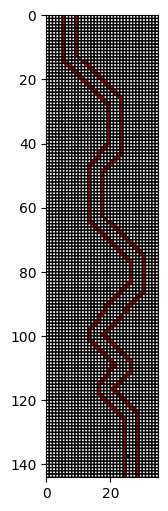

...

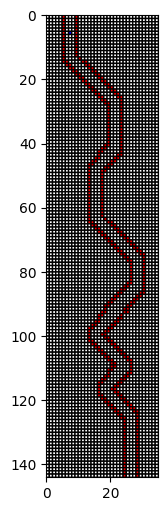

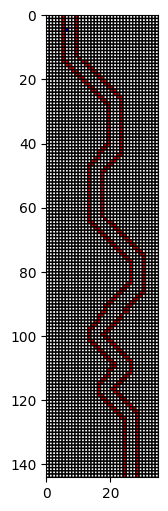

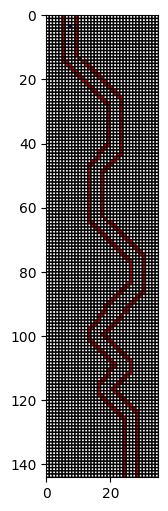

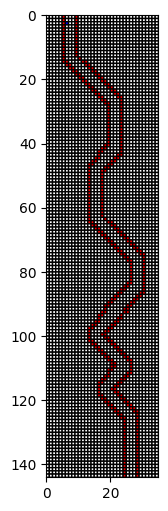

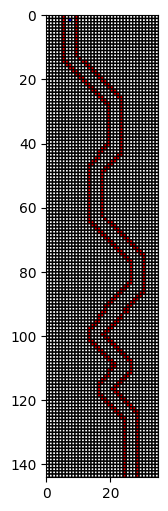

In [ ]:
# Plot
cmap = colors.ListedColormap(['white','red', 'blue'])
def generate_plot(track):
  plt.figure(figsize=(6,6))
  plt.gca().invert_yaxis()
  plt.pcolor(track,cmap=cmap,edgecolors='k', linewidths=1)
  plt.gca().set_aspect('equal')
  display.clear_output(wait=True)
  display.display(plt.gcf())
  # plt.pause(0.0001)

# Starting point
h_start = 140
v_start = 26

# H is horizontal movement, V is vertical.
h = h_start
v = v_start
original_track = np.genfromtxt(path + '/test_track.csv', delimiter=',')
track = original_track.copy()

steps = []
for i in range(0, 200):
  steps.append([h, v])

  # Extract the field of view of the car at the current step.
  h_low_grid = h - int((grid_size-1)/2)
  v_low_grid = v - int((grid_size-1)/2)
  track_pov = original_track[h_low_grid: h_low_grid+grid_size, v_low_grid: v_low_grid+grid_size]
  if ((len(track_pov) < grid_size) or (len(track_pov[0]) < grid_size)):
    break

  # Predict next movement, based on the current field of view.
  predicted = predict_direction(track_pov, theta, min_x, max_x, min_y, max_y)
  next_movement = round(predicted*2)

  # Convert prediction to horizontal/vertical movement.
  if next_movement == 0:
    h -= 1
    v -= 1
  elif next_movement == 1:
    h -= 1
  elif next_movement == 2:
    h -= 1
    v += 1

# Generate dynamic plot.
for step in steps:
  track[step[0], step[1]] = 2
  generate_plot(track)
  track[step[0], step[1]] = 0